In [149]:
import sys, os
sys.path.append("/Volumes/Lab/Users/bhofflic/cell_classification/src")
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import scipy
from file_handling import wrapper
from tqdm import tqdm

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [330]:
cch_data = pd.read_pickle('/Volumes/Scratch/Users/bhofflic/correlations/average_cchs.pkl')
training_data = pd.read_pickle('/Volumes/Scratch/Users/bhofflic/correlations/training_data.pkl')

In [331]:

runs_to_drop = [('2018-03-01-6','004'),
                ('2015-09-23-7','037'),
                ('2016-02-17-8','018'),
                ('2016-02-17-8','013'),
                ('2016-02-17-8','017'),
                ('2018-08-07-2','005'),
                ('2018-08-07-9','013'),
                ('2018-08-07-11','011'),
                ('2017-03-15-1','028')]

In [332]:
classification_types = ['ON parasol', 'OFF parasol', 'ON midget', 'OFF midget', 
                        'SBC', 'ON smooth', 'OFF smooth', 
                        'OFF A1', 'ON A1', 'OFF BT', 'OFF blobby amacrine', 'OFF RB']
num_types = len(classification_types)
delays = cch_data.iloc[0].delays.a
cch_length = len(delays)

held_out_templates = {}

pieces = cch_data.piece_id.unique()
for piece_id in pieces:
    type_pair_templates = {(type1, type2): {'1ms':np.zeros(cch_length), '10ms':np.zeros(cch_length), 
                                            '1ms_std':np.zeros(cch_length), '10ms_std':np.zeros(cch_length)} 
                        for type1 in classification_types for type2 in classification_types}
    type_pair_counts = {(type1, type2): 0 for type1 in classification_types for type2 in classification_types}

    avg_cchs_1ms = {}
    avg_cchs_10ms = {}
    runs = []
    for (index, row) in (cch_data.iterrows()):
        if row.name in runs_to_drop:
            continue
        if row['piece_id'] == piece_id:
            continue
        avg_1ms = row['avg_1ms']
        avg_10ms = row['avg_10ms']
        runs.append(row.name)
        
        for type_pair, avg_cch in avg_1ms.a.items():
            type_pair_templates[type_pair]['1ms'] += avg_cch[0,:]
            type_pair_templates[type_pair]['10ms'] += avg_10ms.a[type_pair][0,:]
            type_pair_counts[type_pair] += 1
            avg_cchs_1ms[type_pair] = avg_cchs_1ms.get(type_pair, []) + [avg_cch[0,:]]
            avg_cchs_10ms[type_pair] = avg_cchs_10ms.get(type_pair, []) + [avg_10ms.a[type_pair][0,:]]

    type_pair_templates = {type_pair: {'1ms': type_pair_templates[type_pair]['1ms']/type_pair_counts[type_pair],
                                        '10ms': type_pair_templates[type_pair]['10ms']/type_pair_counts[type_pair],
                                        'all_1ms_avg': avg_cchs_1ms[type_pair],
                                        'all_10ms_avg': avg_cchs_10ms[type_pair],
                                        'runs': runs}
                            for type_pair in type_pair_templates.keys() if type_pair_counts[type_pair] > 0}
    
    held_out_templates[piece_id] = type_pair_templates


In [156]:
cch_data = pd.read_pickle('/Volumes/Scratch/Users/bhofflic/correlations/average_cchs.pkl')
training_data = pd.read_pickle('/Volumes/Scratch/Users/bhofflic/correlations/training_data.pkl')

runs_to_drop = [('2018-03-01-6','004'),
                ('2015-09-23-7','037'),
                ('2016-02-17-8','018'),
                ('2016-02-17-8','013'),
                ('2016-02-17-8','017'),
                ('2018-08-07-2','005'),
                ('2018-08-07-9','013'),
                ('2018-08-07-11','011'),
                ('2017-03-15-1','028')]
classification_types = ['ON parasol', 'OFF parasol', 'ON midget', 'OFF midget', 
                        'SBC', 'ON smooth', 'OFF smooth', 
                        'OFF A1', 'ON A1', 'OFF BT', 'OFF blobby amacrine', 'OFF RB']
num_types = len(classification_types)
delays = cch_data.iloc[0].delays.a
cch_length = len(delays)


middle_bound = [103,120]
min_bound = [107-middle_bound[0],114 - middle_bound[1]]
max_bound = [103-middle_bound[0],117 - middle_bound[1]]

held_out_templates = {}

pieces = cch_data.piece_id.unique()
for piece_id in tqdm(pieces):
    type_pair_templates = {(type1, type2): {'1ms':[], '10ms':[]} 
                        for type1 in classification_types for type2 in classification_types}

    avg_cchs = {(type1, type2): {'1ms':{}, '10ms':{}} 
                        for type1 in classification_types for type2 in classification_types}
    for (index, row) in (training_data.iterrows()):
        if row['cell_type'] not in classification_types:
            continue
        run = (row.piece_id, row.run_id)
        if run in runs_to_drop:
            continue
        if row['piece_id'] == piece_id:
            continue
        # avg_1ms = row['avg_1ms']
        # avg_10ms = row['avg_10ms']
        for anchor_type in classification_types:
            if row[anchor_type] is None:
                continue
            type_pair = (row['cell_type'], anchor_type)
            row_anchor_1ms = (row[anchor_type].a[0,:]-np.mean(np.concatenate([row[anchor_type].a[0,:][:10], row[anchor_type].a[0,:][-10:]])))
            if np.max(np.abs(row_anchor_1ms[middle_bound[0]:middle_bound[1]])) == 0:
                continue
            row_anchor_1ms = row_anchor_1ms/np.max(np.abs(row_anchor_1ms[middle_bound[0]:middle_bound[1]]))
            row_anchor_10ms = (row[anchor_type].a[1,:]-np.mean(np.concatenate([row[anchor_type].a[1,:][:10], row[anchor_type].a[1,:][-10:]])))
            if np.max(np.abs(row_anchor_10ms[middle_bound[0]:middle_bound[1]])) == 0:
                continue
            row_anchor_10ms = row_anchor_10ms/np.max(np.abs(row_anchor_10ms[middle_bound[0]:middle_bound[1]]))
            type_pair_templates[type_pair]['1ms'].append(row_anchor_1ms)
            type_pair_templates[type_pair]['10ms'].append(row_anchor_10ms)
            avg_cchs[type_pair]['1ms'][run] = avg_cchs[type_pair]['1ms'].get(run, []) + [row_anchor_1ms]
            avg_cchs[type_pair]['10ms'][run] = avg_cchs[type_pair]['10ms'].get(run, []) + [row_anchor_10ms]
                
    
    avg_run_cchs = {type_pair: {'1ms': [(np.mean(avg_cchs[type_pair]['1ms'][run], axis=0), run) for run in avg_cchs[type_pair]['1ms'].keys()],
                                '10ms': [(np.mean(avg_cchs[type_pair]['10ms'][run], axis=0), run) for run in avg_cchs[type_pair]['10ms'].keys()]}
                    for type_pair in avg_cchs.keys()}
        
        # for type_pair, avg_cch in avg_1ms.a.items():
        #     type_pair_templates[type_pair]['1ms'] += avg_cch[0,:]
        #     type_pair_templates[type_pair]['10ms'] += avg_10ms.a[type_pair][0,:]
        #     type_pair_counts[type_pair] += 1
        #     avg_cchs_1ms[type_pair] = avg_cchs_1ms.get(type_pair, []) + [avg_cch[0,:]]
        #     avg_cchs_10ms[type_pair] = avg_cchs_10ms.get(type_pair, []) + [avg_10ms.a[type_pair][0,:]]

    type_pair_templates = {type_pair: {'1ms': np.mean(type_pair_templates[type_pair]['1ms'], axis=0),
                                        '10ms': np.mean(type_pair_templates[type_pair]['10ms'], axis=0),
                                        'all_avg': avg_run_cchs[type_pair]}
                            for type_pair in type_pair_templates.keys() if len(type_pair_templates[type_pair]['1ms']) > 0}
    
    held_out_templates[piece_id] = type_pair_templates


100%|██████████| 23/23 [06:05<00:00, 15.87s/it]


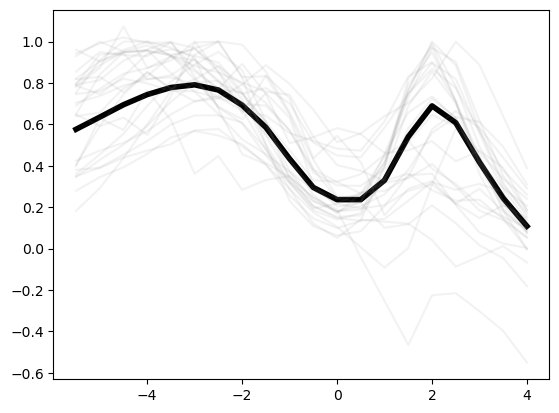

In [322]:
type_pair = ('OFF RB', 'OFF A1')
# ax = plt.subplot(num_types, num_types, i+1)
plt.plot(delays[middle_bound[0]:middle_bound[1]]*1000, type_pair_templates[type_pair]['1ms'][middle_bound[0]:middle_bound[1]], linewidth = 4, color='black')
for cch in type_pair_templates[type_pair]['all_avg']['1ms']:
    plt.plot(delays[middle_bound[0]:middle_bound[1]]*1000, cch[0][middle_bound[0]:middle_bound[1]], color='gray', alpha=0.1)

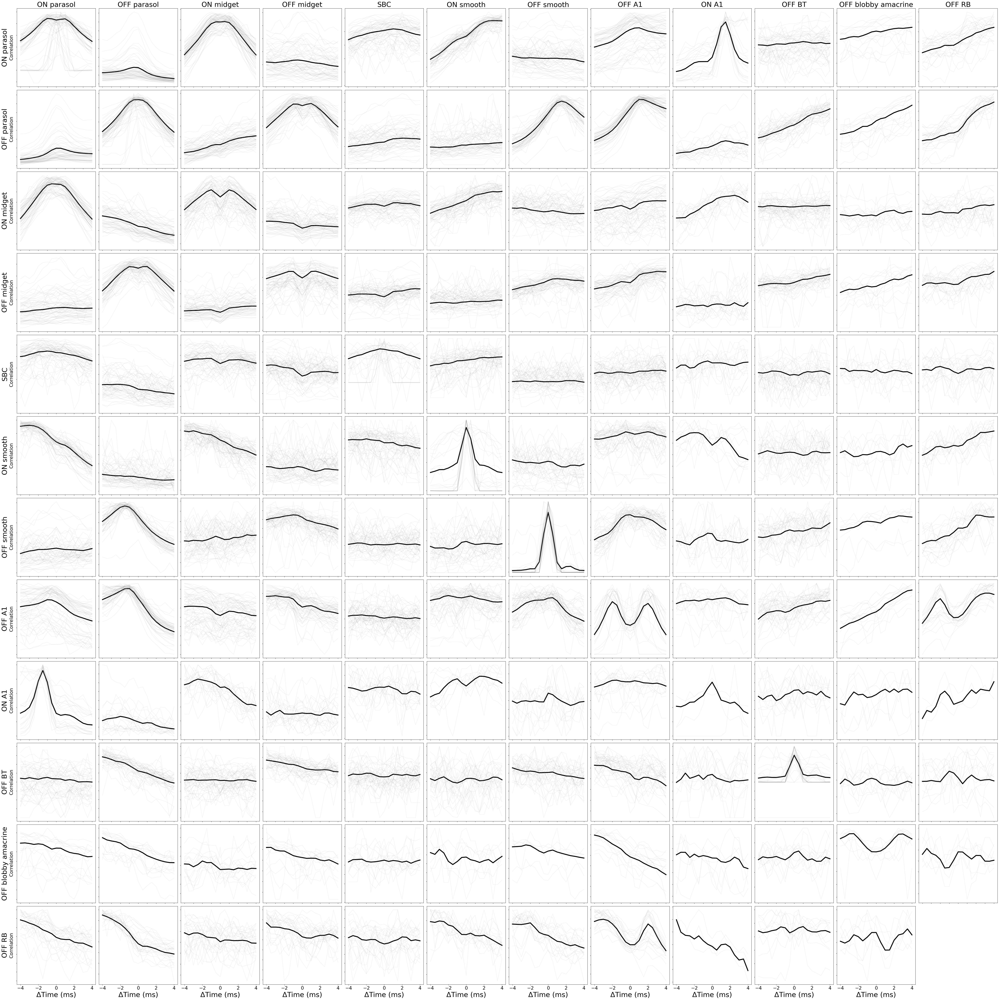

In [320]:
import matplotlib.pyplot as plt

# Assuming 'num_types', 'type_pair_templates', and 'delays' are defined
plt.figure(figsize=(5*num_types, 5*num_types))

for i, type_pair in enumerate(type_pair_templates.keys()):
    ax = plt.subplot(num_types, num_types, i+1)
    ax.plot(delays[middle_bound[0]:middle_bound[1]]*1000, type_pair_templates[type_pair]['1ms'][middle_bound[0]:middle_bound[1]], linewidth = 4, color='black')
    for cch in type_pair_templates[type_pair]['all_avg']['1ms']:
        ax.plot(delays[middle_bound[0]:middle_bound[1]]*1000, cch[0][middle_bound[0]:middle_bound[1]], color='gray', alpha=0.1)
    
    # Manage x-ticks and y-ticks visibility
    if (i // num_types) != (num_types - 1):  # Not in the last row
        ax.set_xticklabels([])  # Hide x-tick labels
        
    ax.set_yticklabels([])  # Hide y-tick labels

    # Labels for type_pair[0] and type_pair[1]
    if (i % num_types) == 0:  # First column
        ax.set_ylabel(type_pair[0], fontsize=30, labelpad=30)  # Adjust labelpad as needed
        ax.text(-0.1, 0.5, 'Correlation', transform=ax.transAxes, fontsize=20,
                verticalalignment='center', rotation='vertical')
    if (i // num_types) == 0:  # First row
        ax.set_title(type_pair[1],fontsize=30)  # Horizontal labels for type_pair[1]
    if (i // num_types) == (num_types - 1):  # Last row
        # ax.set_xticks([-100,-50,0,50,100])
        ax.tick_params(axis='x', labelsize=20)
        ax.set_xlabel('ΔTime (ms)', fontsize=30)  # Adjust labelpad as needed

plt.tight_layout()
plt.show()


In [571]:
cutoff = 8
# anchor_types = classification_types
# anchor_types= classification_types
# anchor_types = classification_types[:cutoff]
anchor_types = ['ON parasol','OFF parasol','OFF A1']
# anchor_types = ['ON midget', 'OFF midget']
# classify_types = [ctype for ctype in classification_types if ctype not in anchor_types + ['ON parasol', 'OFF parasol', 'ON midget', 'OFF midget', 'OFF A1','OFF blobby amacrine']]
# classify_types = classification_types[cutoff:]
classify_types = ["SBC","ON smooth", "OFF smooth","ON A1", "OFF BT", "OFF RB"]
middle_bound = [100,120]
min_bound = [107-middle_bound[0],114 - middle_bound[1]]
max_bound = [100-middle_bound[0],117 - middle_bound[1]]

In [572]:
from sklearn.decomposition import PCA
anchor_left_pc_bases = {}
anchor_middle_pc_bases = {}
anchor_right_pc_bases = {}
anchor_10_pc_bases = {}

# for j, anchor_type in enumerate(anchor_types):
#     all_ctype_1ms = []
#     for uid, row in training_data.iterrows():
#         if not row[anchor_type]:
#             continue
#         cell_cch = row[anchor_type].a[0][:middle_bound[0]]/np.max(np.abs(row[anchor_type].a[0]))
#         all_ctype_1ms.append(cell_cch)
#     anchor_cov = np.cov(np.array(all_ctype_1ms).T)
#     pca = PCA(n_components=8)
#     pca.fit(all_ctype_1ms)
#     anchor_pcs = pca.components_
#     anchor_left_pc_bases[anchor_type] = anchor_pcs
    
# for j, anchor_type in enumerate(anchor_types):
#     all_ctype_1ms = []
#     for uid, row in training_data.iterrows():
#         if not row[anchor_type]:
#             continue
#         cell_cch = row[anchor_type].a[0][middle_bound[0]:middle_bound[1]]/np.max(np.abs(row[anchor_type].a[0]))
#         all_ctype_1ms.append(cell_cch)
#     anchor_cov = np.cov(np.array(all_ctype_1ms).T)
#     pca = PCA(n_components=8)
#     pca.fit(all_ctype_1ms)
#     anchor_pcs = pca.components_
#     anchor_middle_pc_bases[anchor_type] = anchor_pcs
    
for j, anchor_type in enumerate(anchor_types):
    all_ctype_1ms = []
    # for uid, row in training_data.iterrows():
    #     if not row[anchor_type]:
    #         continue
    #     cell_cch = row[anchor_type].a[0][middle_bound[1]:]/np.max(np.abs(row[anchor_type].a[0]))
    #     all_ctype_1ms.append(cell_cch)
    for piece_id in held_out_templates.keys():
        for type_pair in held_out_templates[piece_id].keys():
            if type_pair[0] == anchor_type:
                template = held_out_templates[piece_id][type_pair]['1ms'][middle_bound[0]:middle_bound[1]]
                norm_template = template - np.min(template[min_bound[0]:min_bound[1]])
                norm_template = norm_template/np.max(norm_template[max_bound[0]:max_bound[1]])
                all_ctype_1ms.append(held_out_templates[piece_id][type_pair]['1ms'][middle_bound[0]:middle_bound[1]])
    anchor_cov = np.cov(np.array(all_ctype_1ms).T)
    pca = PCA(n_components=8)
    pca.fit(all_ctype_1ms)
    anchor_pcs = pca.components_
    anchor_right_pc_bases[anchor_type] = anchor_pcs

for j, anchor_type in enumerate(anchor_types):
    all_ctype_10ms = []
    # for uid, row in training_data.iterrows():
    #     if not row[anchor_type]:
    #         continue
    #     cell_cch = row[anchor_type].a[1]/np.max(np.abs(row[anchor_type].a[1]))
    #     all_ctype_10ms.append(cell_cch)
    for piece_id in held_out_templates.keys():
        for type_pair in held_out_templates[piece_id].keys():
            if type_pair[0] == anchor_type:
                all_ctype_10ms.append(held_out_templates[piece_id][type_pair]['10ms'])
    anchor_cov = np.cov(np.array(all_ctype_10ms).T)
    pca = PCA(n_components=8)
    pca.fit(all_ctype_10ms)
    anchor_pcs = pca.components_
    anchor_10_pc_bases[anchor_type] = anchor_pcs

In [573]:
piece = pieces[11]
type_pair = ('OFF blobby amacrine','OFF blobby amacrine')
# type_pair = ('OFF A1','OFF A1')
# type_pair = ('OFF RB','OFF A1')
template = piece_templates[piece]['right'][type_pair]
plt.plot(template)
class_type, anchor = type_pair
class_type = 'OFF BT'
rbs = pc_cells.query('cell_type == @class_type and piece_id == @piece')
for idx, rb in rbs.iterrows():
    if rb[anchor] is np.nan:
        continue
    cch = rb[anchor]['right']
    plt.plot(cch, alpha=0.2)

KeyError: ('OFF blobby amacrine', 'OFF blobby amacrine')

In [ ]:
piece_templates = {}
for piece_id in training_data.piece_id.unique():
    template = held_out_templates[piece_id]
    pc_templates_left = {}
    pc_templates_middle = {}
    pc_templates_right = {}
    pc_templates_10 = {}
    for ctype in classification_types:
        for anchor_type in anchor_types:
            if (ctype, anchor_type) not in template.keys():
                continue
            # orig_template = template[ctype, anchor_type]['1ms'][:middle_bound[0]]
            # pc_template = np.dot(orig_template, anchor_left_pc_bases[anchor_type].T)
            # pc_templates_left[(ctype, anchor_type)] = np.dot(pc_template, anchor_left_pc_bases[anchor_type])
            
            # orig_template = template[ctype, anchor_type]['1ms'][middle_bound[0]:middle_bound[1]]
            # pc_template = np.dot(orig_template, anchor_middle_pc_bases[anchor_type].T)
            # pc_templates_middle[(ctype, anchor_type)] = np.dot(pc_template, anchor_middle_pc_bases[anchor_type])
            
            orig_template = template[ctype, anchor_type]['1ms'][middle_bound[0]:middle_bound[1]]
            orig_template = orig_template - np.min(orig_template[min_bound[0]:min_bound[1]])
            orig_template = orig_template/np.max(orig_template[max_bound[0]:max_bound[1]])
            pc_template = np.dot(orig_template, anchor_right_pc_bases[anchor_type].T)
            # pc_templates_right[(ctype, anchor_type)] = np.dot(pc_template, anchor_right_pc_bases[anchor_type])
            # pc_templates_right[(ctype, anchor_type)] = pc_template
            pc_templates_right[(ctype, anchor_type)] = orig_template
            
            orig_template = template[ctype, anchor_type]['10ms']
            pc_template = np.dot(orig_template, anchor_10_pc_bases[anchor_type].T)
            pc_templates_10[(ctype, anchor_type)] = np.dot(pc_template, anchor_10_pc_bases[anchor_type])
            # pc_templates_10[(ctype, anchor_type)] = pc_template
    # piece_templates[piece_id] = {'left': pc_templates_left, 'middle': pc_templates_middle, 'right': pc_templates_right, '10ms': pc_templates_10}
    piece_templates[piece_id] = {'right': pc_templates_right, '10ms': pc_templates_10}

In [ ]:
pc_cells = {column: [] for column in anchor_types}
pc_cells['piece_id'] = []
pc_cells['run_id'] = []
pc_cells['unit_id'] = []
pc_cells['cell_type'] = []
for uid, row in training_data.iterrows():
    pc_cells['piece_id'].append(row['piece_id'])
    pc_cells['run_id'].append(row['run_id'])
    pc_cells['unit_id'].append(row['unit_id'])
    pc_cells['cell_type'].append(row['cell_type'])
    for anchor_type in anchor_types:
        if not row[anchor_type]:
            pc_cells[(anchor_type)].append(np.nan)
            continue
        row_right = row[anchor_type].a[0][middle_bound[0]:middle_bound[1]]
        row_right = row_right - np.min(row_right[min_bound[0]:min_bound[1]])
        if np.max(row_right[max_bound[0]:max_bound[1]]) == 0:
            pc_cells[(anchor_type)].append(np.nan)
            continue
        row_right = row_right/np.max(row_right[max_bound[0]:max_bound[1]])
        # pc_right = np.dot(row_right, anchor_right_pc_bases[anchor_type].T)
        # pc_right = np.dot(pc_right, anchor_right_pc_bases[anchor_type])
        pc_right = row_right
        row_10 = row[anchor_type].a[1]
        pc_10 = np.dot(row_10, anchor_10_pc_bases[anchor_type].T)
        pc_10 = np.dot(pc_10, anchor_10_pc_bases[anchor_type])
        # pc_cells[(anchor_type)].append({'left': pc_left, 'middle': pc_middle, 'right': pc_right, '10ms': pc_10})
        pc_cells[(anchor_type)].append({'right': pc_right, '10ms': pc_10})
pc_cells = pd.DataFrame(pc_cells)
pc_cells

,ON parasol,OFF parasol,ON midget,OFF midget,SBC,ON smooth,OFF smooth,OFF A1,ON A1,OFF BT,OFF RB,piece_id,run_id,unit_id,cell_type
0,"{'right': [0.2968579933126988, 0.3343169685785...","{'right': [0.026674995040495374, 0.29881205394...","{'right': [0.8345154434884172, 1.0, 0.05869381...","{'right': [-0.4169588666077568, -0.30450150971...","{'right': [-0.2542222798183259, 0.428602917453...",NaN,NaN,NaN,NaN,NaN,NaN,2015-09-23-7,037,1.0,OFF midget
1,"{'right': [-0.546321443056559, -0.550219631736...","{'right': [-1.2424987724582328, -1.19953638864...","{'right': [-0.4885899703802049, -0.18359911931...","{'right': [-0.5956943030511688, -0.71551881620...","{'right': [0.12835035519521762, -0.08880094738...",NaN,"{'right': [-0.3687533948940792, -0.27227050516...",NaN,NaN,NaN,NaN,2015-09-23-7,037,2.0,OFF parasol
2,"{'right': [0.38429771340639207, 0.621883182203...","{'right': [0.4568672640386011, 0.4187232885644...","{'right': [0.41496504989737787, 0.725919743130...","{'right': [-0.9879673407418211, -0.24138192899...","{'right': [-0.06066573464477033, -0.2015931908...",NaN,"{'right': [0.8886587260486796, 0.8146038322112...",NaN,NaN,NaN,NaN,2015-09-23-7,037,3.0,OFF midget
3,"{'right': [-1.149366855922139, -0.755391149939...","{'right': [-2.0742308689804294, -1.87262912888...","{'right': [-0.2737495264726739, -0.87119118060...","{'right': [-0.7387926832013977, -0.96789982522...","{'right': [-0.2587463556851318, 0.296647230320...",NaN,"{'right': [-0.9408133136491752, -1.09676553482...",NaN,NaN,NaN,NaN,2015-09-23-7,037,4.0,OFF parasol
4,"{'right': [1.0, 0.39213617886642566, 0.2557474...","{'right': [1.0, 0.7600094354810013, 0.71891882...","{'right': [0.12517629253911844, 0.125176292539...","{'right': [0.9928344811440166, 0.6007134161573...",NaN,NaN,"{'right': [0.7998595505617977, 0.6664325842696...",NaN,NaN,NaN,NaN,2015-09-23-7,037,5.0,ON midget
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57834,"{'right': [-0.26126126126126115, -0.5219594594...",NaN,"{'right': [-0.10072670616081617, -0.0031346352...","{'right': [-0.569330981796078, -0.674919671042...",NaN,NaN,NaN,"{'right': [-0.5715152741250256, -0.49221120776...",NaN,"{'right': [-2.4435440302539173, -1.77741761210...",NaN,2016-10-04-6,001,91424.0,OFF parasol
57835,"{'right': [-1.0001598210004794, -0.93287517979...",NaN,NaN,"{'right': [0.5454018149713783, 0.5992668862212...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-10-04-6,001,91425.0,contaminated
57836,"{'right': [-1.52865907099036, -1.4429447852760...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016-10-04-6,001,91426.0,ON midget
57837,"{'right': [-0.3579603515225836, 0.283977110157...","{'right': [0.6784648187633262, 0.5356076759061...",NaN,NaN,NaN,NaN,NaN,"{'right': [0.33317399617590837, 0.476099426386...",NaN,"{'right': [0.6297397769516728, 0.8520446096654...",NaN,2016-10-04-6,001,91428.0,ON midget


In [590]:
pc_cells_good = pc_cells.query("cell_type in @classify_types")
scores = {}
for idx, cell in pc_cells_good.iterrows():
    score_right = np.zeros((len(classification_types), len(anchor_types)))*np.nan
    score_10 = np.zeros((len(classification_types), len(anchor_types)))*np.nan
    pc_templates_right = piece_templates[cell['piece_id']]['right']
    pc_templates_10 = piece_templates[cell['piece_id']]['10ms']
    for i, ctype in enumerate(classification_types):
        for j, anchor_type in enumerate(anchor_types):
            if cell[anchor_type] is np.nan:
                continue
            if (ctype, anchor_type) not in pc_templates_right.keys():
                continue
            cell_right = (cell[anchor_type]['right'])
            anchor_right = (pc_templates_right[(ctype, anchor_type)])
            # score_right[i, j] = (np.dot(cell_right, anchor_right))/(np.sqrt(np.dot(cell_right, cell_right))*np.sqrt(np.dot(anchor_right, anchor_right)))
            score_right[i,j] = np.linalg.norm(cell_right - anchor_right, 2)
            cell_10 = (cell[anchor_type]['10ms'])
            cell_10 = cell_10 - np.mean(cell_10)
            cell_10 = cell_10/np.max(np.abs(cell_10))
            anchor_10 = (pc_templates_10[(ctype, anchor_type)])
            anchor_10 = anchor_10 - np.mean(anchor_10)
            anchor_10 = anchor_10/np.max(np.abs(anchor_10))
            score_10[i, j] = (np.dot(cell_10, anchor_10))/(np.sqrt(np.dot(cell_10, cell_10))*np.sqrt(np.dot(anchor_10, anchor_10)))
            # score_10[i,j] = np.linalg.norm(cell[anchor_type]['10ms'] - pc_templates_10[(ctype, anchor_type)])
    # cell_scores = np.concatenate([score_left.flatten(), score_middle.flatten(), score_right.flatten(), score_10.flatten()])
    cell_scores = np.concatenate([score_right.flatten(), score_10.flatten()])
    scores[(cell['piece_id'], cell['run_id'], cell['unit_id'])] = cell_scores
scores = pd.DataFrame(scores).T
# scores = scores.apply(lambda x: x.fillna(x.mean()), axis=0)
scores = scores.fillna(-1)
scores.loc[:, 'piece_id'] = pc_cells_good['piece_id'].values
scores.loc[:, 'label'] = pc_cells_good['cell_type'].values
# scores = scores.dropna()
scores

0         1         2         3         4  \
2015-09-23-7 037 12.0     7.976243  1.674549 -1.000000  2.052808  3.266149   
                 27.0     6.431661  1.454095 -1.000000  1.648326  4.494058   
                 31.0     7.535174  1.649371 -1.000000  2.173524  5.173252   
                 43.0     7.619657  3.128995 -1.000000  3.766065  6.348064   
                 77.0     8.231593  2.708762 -1.000000  2.594289  5.817240   
...                            ...       ...       ...       ...       ...   
2016-10-04-6 001 91332.0  7.869121  3.234789  3.389116  2.553716  6.416172   
                 91339.0 -1.000000  1.835922 -1.000000 -1.000000  4.443681   
                 91348.0  7.241006  2.433058  3.519620  2.249801  5.799728   
                 91360.0  7.155791  2.288882  3.761271  3.023458  5.518337   
                 91401.0  5.045946  2.155120 -1.000000  5.845092  4.901928   

                                 5         6         7         8         9  \
2015-09-23-7 037 12.0    -1.000000  6.961155  3.532134 -1.000000  3.512428   
                 27.0    -1.000000  5.407762  2.388557 -1.000000  1.356438   
                 31.0    -1.000000  6.540360  1.812617 -1.000000  3.317419   
                 43.0    -1.000000  6.794871  1.076824 -1.000000  5.210604   
                 77.0    -1.000000  7.207813  1.339520 -1.000000  4.127193   
...                            ...       ...       ...       ...       ...   
2016-10-04-6 001 91332.0  3.237952  7.938262  1.615814  3.018281  4.249427   
                 91339.0 -1.000000 -1.000000  2.562481 -1.000000 -1.000000   
                 91348.0  3.527730  7.357430  1.340741  3.623261  3.256521   
                 91360.0  3.720402  7.248282  1.904790  3.660292  4.428322   
                 91401.0 -1.000000  5.110923  2.281550 -1.000000  5.910399   

                          ...        58        59        60        61  \
2015-09-23-7 037 12.0     ... -0.714226 -1.000000  0.394837  0.224077   
                 27.0     ... -0.530537 -1.000000  0.190974  0.296834   
                 31.0     ... -0.721659 -1.000000  0.472729  0.291410   
                 43.0     ...  0.538588 -1.000000  0.355792  0.267917   
                 77.0     ...  0.277936 -1.000000  0.052628  0.722408   
...                       ...       ...       ...       ...       ...   
2016-10-04-6 001 91332.0  ...  0.143281  0.325438  0.486907  0.965043   
                 91339.0  ... -0.515360 -1.000000 -1.000000  0.645991   
                 91348.0  ...  0.025301  0.623947  0.186920  0.949463   
                 91360.0  ... -0.271790  0.510523  0.074954  0.960626   
                 91401.0  ... -0.593613 -1.000000  0.810412  0.827740   

                                62        63        64        65  \
2015-09-23-7 037 12.0    -1.000000 -0.261165  0.363384 -1.000000   
                 27.0    -1.000000 -0.114115  0.430358 -1.000000   
                 31.0    -1.000000 -0.178282  0.449451 -1.000000   
                 43.0    -1.000000  0.273635  0.213350 -1.000000   
                 77.0    -1.000000  0.447723  0.515568 -1.000000   
...                            ...       ...       ...       ...   
2016-10-04-6 001 91332.0  0.982881  0.399206  0.854944  0.794893   
                 91339.0 -1.000000 -1.000000  0.728258 -1.000000   
                 91348.0  0.902668  0.347869  0.939014  0.921859   
                 91360.0  0.965731  0.572617  0.969996  0.913049   
                 91401.0 -1.000000 -0.167477  0.874180 -1.000000   

                              piece_id       label  
2015-09-23-7 037 12.0     2015-09-23-7  OFF smooth  
                 27.0     2015-09-23-7  OFF smooth  
                 31.0     2015-09-23-7  OFF smooth  
                 43.0     2015-09-23-7         SBC  
                 77.0     2015-09-23-7      OFF BT  
...                                ...         ...  
2016-10-04-6 001 91332.0  2016-10-04-6      OFF BT  
                 91339.0  2016-10-04-6   

In [591]:
from sklearn.utils import resample
# Find the number of samples needed for each class
def hybrid_resample(group, n_samples):
    if len(group) >= n_samples:
        # If there are enough samples, no need for replacement
        return resample(group, replace=False, n_samples=n_samples, random_state=123)
    else:
        # Use all available samples once without replacement
        without_replacement = resample(group, replace=False, n_samples=len(group), random_state=123)
        # Resample with replacement to fill the rest
        additional_needed = n_samples - len(group)
        with_replacement = resample(group, replace=True, n_samples=additional_needed, random_state=123)
        return pd.concat([without_replacement, with_replacement])


Accuracy: 0.8642478597635548
Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       837
           1       0.68      0.74      0.71       141
           2       0.97      0.90      0.93      1127
           3       0.43      0.60      0.50       125
           4       0.85      0.86      0.86       853
           5       0.92      0.86      0.89      1823

    accuracy                           0.86      4906
   macro avg       0.77      0.81      0.79      4906
weighted avg       0.88      0.86      0.87      4906



<Figure size 1500x1500 with 0 Axes>

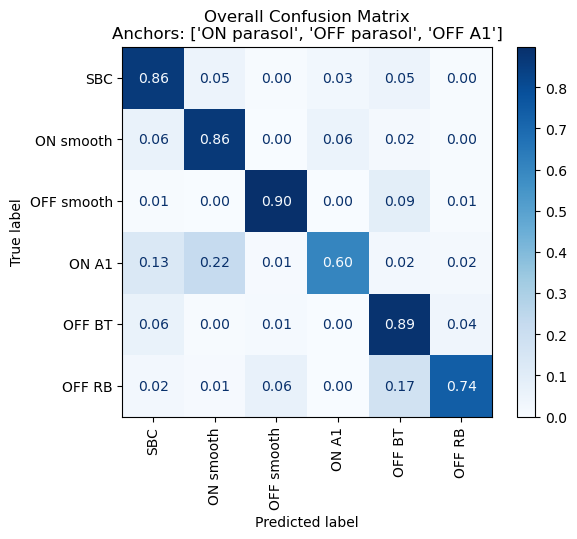

<Figure size 1500x1500 with 0 Axes>

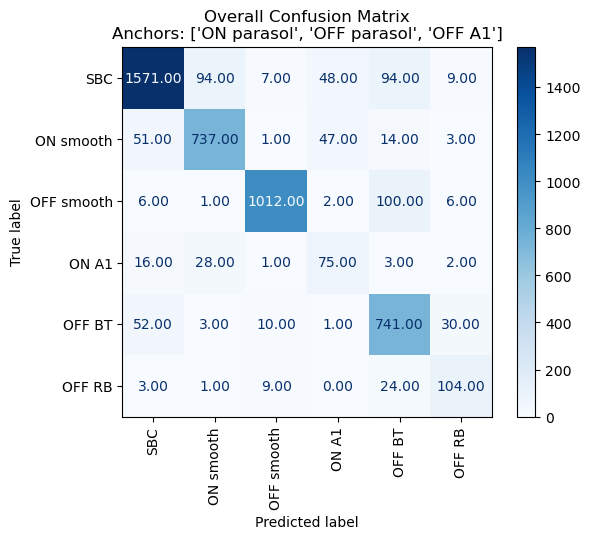

In [594]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report, accuracy_score

features = scores[scores.columns[:-2]].values
labels = scores['label'].values

# Convert categorical labels to numbers
label_encoder = LabelEncoder()
label_encoder.fit(classify_types)
numeric_labels = label_encoder.transform(labels)

# Scale features to improve SVM training
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Split the dataset into training and testing sets
unique_piece_ids = pc_cells_good.piece_id.unique()
train_test_pieces = {}
for piece_id in unique_piece_ids:
    train_ids, test_ids = [unique_piece_ids[i] for i in range(len(unique_piece_ids)) if unique_piece_ids[i] != piece_id], [piece_id]

    train_mask = scores.piece_id.isin(train_ids)
    test_mask = scores.piece_id.isin(test_ids)

    # Use boolean masks to select data
    X_train = scaled_features[train_mask]
    y_train = numeric_labels[train_mask]
    X_test = scaled_features[test_mask]
    
    # rus = RandomUnderSampler(random_state=42)
    # X_train, y_train = rus.fit_resample(X_train, y_train)
    
    # Assuming X_train and y_train are originally numpy arrays, convert them to DataFrame/Series
    if isinstance(X_train, np.ndarray):
        X_train = pd.DataFrame(X_train, columns=[f'feature_{i}' for i in range(X_train.shape[1])])

    if isinstance(y_train, np.ndarray):
        y_train = pd.Series(y_train, name='label')

    # Now concatenate them
    train_df = pd.concat([X_train, y_train], axis=1)
    
    max_size = train_df['label'].value_counts().max()
    # List to hold resampled dataframes
    resampled_dataframes = []
    for class_index, group in train_df.groupby('label'):
        resampled_class = hybrid_resample(group, max_size)
        resampled_dataframes.append(resampled_class)

    # Concatenate all resampled classes back into one DataFrame
    balanced_df = pd.concat(resampled_dataframes)
    
    X_train = balanced_df.drop('label', axis=1).values
    y_train = balanced_df['label'].values
    
    y_test = numeric_labels[test_mask]
    
    if len(y_train) == 0 or len(y_test) == 0:
        print("Skipping piece", piece_id)
        continue
    train_test_pieces[piece_id] = (X_train, y_train, X_test, y_test)

from sklearn.svm import SVC


all_true_labels = {}
all_predictions = {}
for piece_id, (X_train, y_train, X_test, y_test) in train_test_pieces.items():
    # Initialize and train the SVM model
    svm_model = SVC( kernel='poly', degree=3, C=1.0)
    svm_model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred = svm_model.predict(X_test)

    # Store results
    all_true_labels[piece_id] = y_test
    all_predictions[piece_id] = y_pred
    

print("Accuracy:", accuracy_score(np.concatenate(list(all_true_labels.values())), np.concatenate(list(all_predictions.values()))))
print("Classification Report:")
print(classification_report(np.concatenate(list(all_true_labels.values())), np.concatenate(list(all_predictions.values()))))

overall_cm = confusion_matrix(np.concatenate(list(all_true_labels.values())), np.concatenate(list(all_predictions.values())), normalize='true', labels=label_encoder.transform(classify_types))
# Display the confusion matrix using ConfusionMatrixDisplay
plt.figure(figsize=(15, 15))
disp = ConfusionMatrixDisplay(confusion_matrix=overall_cm, display_labels=classify_types)
disp.plot(cmap='Blues', xticks_rotation='vertical', values_format='.2f')
plt.title(f'Overall Confusion Matrix\nAnchors: {anchor_types}')
plt.show()

plt.figure(figsize=(15, 15))
overall_cm = confusion_matrix(np.concatenate(list(all_true_labels.values())), np.concatenate(list(all_predictions.values())), labels=label_encoder.transform(classify_types))
# Display the confusion matrix using ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=overall_cm, display_labels=classify_types)
disp.plot(cmap='Blues', xticks_rotation='vertical', values_format='.2f')
plt.title(f'Overall Confusion Matrix\nAnchors: {anchor_types}')
plt.show()

Accuracy: 0.87708927843457
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.88      0.81       837
           1       0.77      0.58      0.66       141
           2       0.96      0.92      0.94      1127
           3       0.70      0.42      0.53       125
           4       0.87      0.89      0.88       853
           5       0.92      0.89      0.90      1823

    accuracy                           0.88      4906
   macro avg       0.83      0.77      0.79      4906
weighted avg       0.88      0.88      0.88      4906



<Figure size 1500x1500 with 0 Axes>

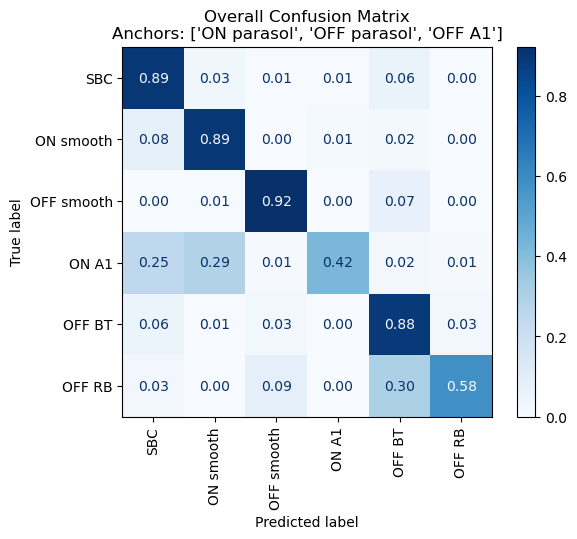

<Figure size 1500x1500 with 0 Axes>

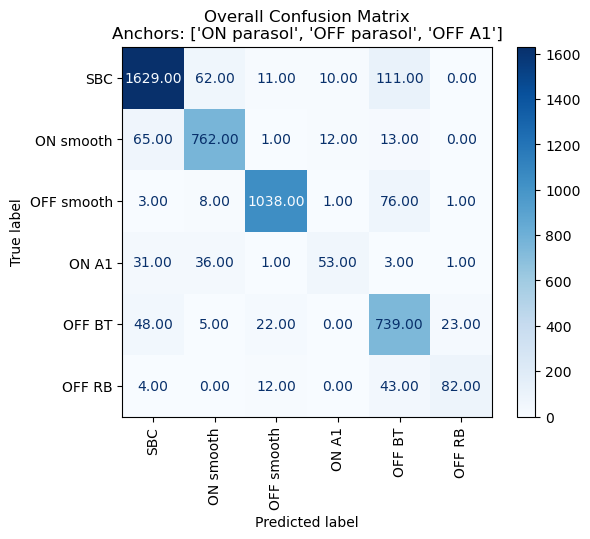

In [593]:
from sklearn.ensemble import RandomForestClassifier
# Initialize the Random Forest classifier


all_true_labels = []
all_predictions = []
for (X_train, y_train, X_test, y_test) in train_test_pieces.values():
    rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=43)

    # Train the model
    rf.fit(X_train, y_train)
    # Make predictions
    y_pred = rf.predict(X_test)

    # Store results
    all_true_labels.extend(y_test)
    all_predictions.extend(y_pred)
    
print("Accuracy:", accuracy_score(all_true_labels, all_predictions))
print("Classification Report:")
print(classification_report(all_true_labels, all_predictions))

plt.figure(figsize=(15, 15))
overall_cm = confusion_matrix(all_true_labels, all_predictions,normalize='true', labels=label_encoder.transform(classify_types))
# Display the confusion matrix using ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=overall_cm, display_labels=classify_types)
disp.plot(cmap='Blues', xticks_rotation='vertical', values_format='.2f')
plt.title(f'Overall Confusion Matrix\nAnchors: {anchor_types}')
plt.show()

plt.figure(figsize=(15, 15))
overall_cm = confusion_matrix(all_true_labels, all_predictions, labels=label_encoder.transform(classify_types))
# Display the confusion matrix using ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=overall_cm, display_labels=classify_types)
disp.plot(cmap='Blues', xticks_rotation='vertical', values_format='.2f')
plt.title(f'Overall Confusion Matrix\nAnchors: {anchor_types}')
plt.show()
